In [1]:
# Import Data and Required Packages
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [2]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

In [3]:
import plotly.express as px
import plotly.io as pio  

# List of renderers 
preferred_renderers = ["notebook", "colab", "browser", "iframe"]

for r in preferred_renderers:
    try:
        pio.renderers.default = r
        break
    except Exception:
        continue

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [5]:
# Load The Dataset
df = pd.read_csv("car_prices.csv")
df.head()

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg566472,ca,5.0,16639.0,white,black,kia motors america inc,20500.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
1,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg561319,ca,5.0,9393.0,white,beige,kia motors america inc,20800.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,wba3c1c51ek116351,ca,45.0,1331.0,gray,black,financial services remarketing (lease),31900.0,30000.0,Thu Jan 15 2015 04:30:00 GMT-0800 (PST)
3,2015,Volvo,S60,T5,Sedan,automatic,yv1612tb4f1310987,ca,41.0,14282.0,white,black,volvo na rep/world omni,27500.0,27750.0,Thu Jan 29 2015 04:30:00 GMT-0800 (PST)
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,wba6b2c57ed129731,ca,43.0,2641.0,gray,black,financial services remarketing (lease),66000.0,67000.0,Thu Dec 18 2014 12:30:00 GMT-0800 (PST)


In [6]:
# Delete VIN (Vehicle Identification Number)
df.drop(columns=['vin'], axis=1, inplace=True)
df.head()

,year,make,model,trim,body,transmission,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,ca,5.0,16639.0,white,black,kia motors america inc,20500.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
1,2015,Kia,Sorento,LX,SUV,automatic,ca,5.0,9393.0,white,beige,kia motors america inc,20800.0,21500.0,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,ca,45.0,1331.0,gray,black,financial services remarketing (lease),31900.0,30000.0,Thu Jan 15 2015 04:30:00 GMT-0800 (PST)
3,2015,Volvo,S60,T5,Sedan,automatic,ca,41.0,14282.0,white,black,volvo na rep/world omni,27500.0,27750.0,Thu Jan 29 2015 04:30:00 GMT-0800 (PST)
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,ca,43.0,2641.0,gray,black,financial services remarketing (lease),66000.0,67000.0,Thu Dec 18 2014 12:30:00 GMT-0800 (PST)


In [7]:
# Check duplicate values
df.duplicated().sum()

np.int64(0)

In [8]:
# Check Null Value Counts and DataTypes of the features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 558837 entries, 0 to 558836
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          558837 non-null  int64  
 1   make          548536 non-null  object 
 2   model         548438 non-null  object 
 3   trim          548186 non-null  object 
 4   body          545642 non-null  object 
 5   transmission  493485 non-null  object 
 6   state         558837 non-null  object 
 7   condition     547017 non-null  float64
 8   odometer      558743 non-null  float64
 9   color         558088 non-null  object 
 10  interior      558088 non-null  object 
 11  seller        558837 non-null  object 
 12  mmr           558799 non-null  float64
 13  sellingprice  558825 non-null  float64
 14  saledate      558825 non-null  object 
dtypes: float64(4), int64(1), object(10)
memory usage: 64.0+ MB


In [9]:
# Summary of Data
df.describe(include='all')

,year,make,model,trim,body,transmission,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
count,558837.000000,548536,548438,548186,545642,493485,558837,547017.000000,558743.000000,558088,558088,558837,558799.000000,558825.000000,558825
unique,NaN,96,973,1963,87,4,64,NaN,NaN,46,17,14263,NaN,NaN,3766
top,NaN,Ford,Altima,Base,Sedan,automatic,fl,NaN,NaN,black,black,nissan-infiniti lt,NaN,NaN,Tue Feb 10 2015 01:30:00 GMT-0800 (PST)
freq,NaN,93554,19349,55817,199437,475915,82945,NaN,NaN,110970,244329,19693,NaN,NaN,5334
mean,2010.038927,NaN,NaN,NaN,NaN,NaN,NaN,30.672365,68320.017767,NaN,NaN,NaN,13769.377495,13611.358810,NaN
std,3.966864,NaN,NaN,NaN,NaN,NaN,NaN,13.402832,53398.542821,NaN,NaN,NaN,9679.967174,9749.501628,NaN
min,1982.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,25.000000,1.000000,NaN
25%,2007.000000,NaN,NaN,NaN,NaN,NaN,NaN,23.000000,28371.000000,NaN,NaN,NaN,7100.000000,6900.000000,NaN
50%,2012.000000,NaN,NaN,NaN,NaN,NaN,NaN,35.000000,52254.000000,NaN,NaN,NaN,12250.000000,12100.000000,NaN
75%,2013.000000,NaN,NaN,NaN,NaN,NaN,NaN,42.000000,99109.000000,NaN,NaN,NaN,18300.000000,18200.000000,NaN


In [10]:
# Data Cleaning & Preprocessing
# Check empty values
df.isnull().sum()

year                0
make            10301
model           10399
trim            10651
body            13195
transmission    65352
state               0
condition       11820
odometer           94
color             749
interior          749
seller              0
mmr                38
sellingprice       12
saledate           12
dtype: int64

In [11]:
# Fill missing values
df.fillna(df.median(numeric_only=True), inplace=True) #for numeric values: median

for col in df.select_dtypes(include=['object']).columns: #for categorical values: mode
    mode_val = df[col].mode()[0]   
    df[col].fillna(mode_val, inplace=True)

In [12]:
# Convert to datetime
df['saledate'] = pd.to_datetime(df['saledate'], errors='coerce')
df.head()

,year,make,model,trim,body,transmission,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,ca,5.0,16639.0,white,black,kia motors america inc,20500.0,21500.0,2014-12-16 12:30:00+08:00
1,2015,Kia,Sorento,LX,SUV,automatic,ca,5.0,9393.0,white,beige,kia motors america inc,20800.0,21500.0,2014-12-16 12:30:00+08:00
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,ca,45.0,1331.0,gray,black,financial services remarketing (lease),31900.0,30000.0,2015-01-15 04:30:00+08:00
3,2015,Volvo,S60,T5,Sedan,automatic,ca,41.0,14282.0,white,black,volvo na rep/world omni,27500.0,27750.0,2015-01-29 04:30:00+08:00
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,ca,43.0,2641.0,gray,black,financial services remarketing (lease),66000.0,67000.0,2014-12-18 12:30:00+08:00


In [13]:
# Check the number of unique values of each column
df.nunique()

year                34
make                96
model              973
trim              1963
body                87
transmission         4
state               64
condition           41
odometer        172278
color               46
interior            17
seller           14263
mmr               1101
sellingprice      1887
saledate          3745
dtype: int64

In [14]:
# Show Categories in columns
for i in df[['make','body', 'transmission','state', 'color', 'interior']]:
    print(f"The catagories in '{i}' are : ",list(df[i].unique()))

The catagories in 'make' are :  ['Kia', 'BMW', 'Volvo', 'Nissan', 'Chevrolet', 'Audi', 'Ford', 'Hyundai', 'Buick', 'Cadillac', 'Acura', 'Lexus', 'Infiniti', 'Jeep', 'Mercedes-Benz', 'Mitsubishi', 'Mazda', 'MINI', 'Land Rover', 'Lincoln', 'lincoln', 'Jaguar', 'Volkswagen', 'Toyota', 'Subaru', 'Scion', 'Porsche', 'bmw', 'Dodge', 'FIAT', 'Chrysler', 'ford', 'Ferrari', 'Honda', 'GMC', 'mitsubishi', 'Ram', 'smart', 'chevrolet', 'Bentley', 'chrysler', 'pontiac', 'Pontiac', 'Saturn', 'Maserati', 'Mercury', 'HUMMER', 'landrover', 'cadillac', 'land rover', 'mercedes', 'mazda', 'toyota', 'lexus', 'gmc truck', 'honda', 'nissan', 'porsche', 'Saab', 'Suzuki', 'dodge', 'subaru', 'Oldsmobile', 'oldsmobile', 'hyundai', 'jeep', 'Isuzu', 'dodge tk', 'Geo', 'acura', 'volkswagen', 'suzuki', 'kia', 'audi', 'Rolls-Royce', 'gmc', 'maserati', 'mazda tk', 'mercury', 'buick', 'hyundai tk', 'mercedes-b', 'vw', 'Daewoo', 'chev truck', 'ford tk', 'plymouth', 'Plymouth', 'ford truck', 'Tesla', 'airstream', 'dot', '

In [15]:
# Text Standardization (string: lowercase and replace)
#'make' category
df['make'] = df['make'].str.strip().str.lower() 
make_replace = {
    "landrover": "land rover",
    "vw": "volkswagen",
    "mercedes" : "mercedes-benz",
    "mercedes-b": "mercedes-benz",
    "gmc truck": "gmc",
    "dodge tk": "dodge",
    "mazda tk": "mazda",
    "ford tk": "ford",
    "ford truck": "ford",
    "chev truck": "chevrolet"
}
df['make'] = df['make'].replace(make_replace)
print(f"The catagories in 'make' are : ",list(df['make'].unique()))

The catagories in 'make' are :  ['kia', 'bmw', 'volvo', 'nissan', 'chevrolet', 'audi', 'ford', 'hyundai', 'buick', 'cadillac', 'acura', 'lexus', 'infiniti', 'jeep', 'mercedes-benz', 'mitsubishi', 'mazda', 'mini', 'land rover', 'lincoln', 'jaguar', 'volkswagen', 'toyota', 'subaru', 'scion', 'porsche', 'dodge', 'fiat', 'chrysler', 'ferrari', 'honda', 'gmc', 'ram', 'smart', 'bentley', 'pontiac', 'saturn', 'maserati', 'mercury', 'hummer', 'saab', 'suzuki', 'oldsmobile', 'isuzu', 'geo', 'rolls-royce', 'hyundai tk', 'daewoo', 'plymouth', 'tesla', 'airstream', 'dot', 'aston martin', 'fisker', 'lamborghini', 'lotus']


In [16]:
#'body' category
df['body'] = df['body'].str.strip().str.lower() 
df['body'] = df['body'].replace({'navitgation': np.nan})
mode_body = df['body'].mode()[0]  
df['body'] = df['body'].fillna(mode_body)
body_replace = {
    # sedan
    "g sedan": "sedan",

    # convertible
    "g convertible": "convertible",
    "g37 convertible": "convertible",
    "beetle convertible": "convertible",
    "cts-v convertible": "convertible",
    "q60 convertible": "convertible",
    "granturismo convertible": "convertible",

    # coupe
    "g coupe": "coupe",
    "elantra coupe": "coupe",
    "genesis coupe": "coupe",
    "cts coupe": "coupe",
    "q60 coupe": "coupe",
    "g37 coupe": "coupe",
    "cts-v coupe": "coupe",
    "koup": "coupe",

    # wagon
    "cts wagon": "wagon",
    "tsx sport wagon": "wagon",
    "cts-v wagon": "wagon",

    # van / minivan
    "e-series van": "van",
    "transit van": "van",
    "promaster cargo van": "van",
    "ram van": "van",
    "minivan": "van",

    # cab (pickup body style)
    "crew cab": "cab",
    "double cab": "cab",
    "extended cab": "cab",
    "regular cab": "cab",
    "quad cab": "cab",
    "king cab": "cab",
    "crewmax cab": "cab",
    "access cab": "cab",
    "club cab": "cab",
    "xtracab": "cab",
    "cab plus": "cab",
    "cab plus 4": "cab",
    "mega cab": "cab",
    "supercrew": "cab",
    "supercab": "cab",
    "regular-cab": "cab"
}
df['body'] = df['body'].replace(body_replace)
print(f"The catagories in 'body' are : ",list(df['body'].unique()))

The catagories in 'body' are :  ['suv', 'sedan', 'convertible', 'coupe', 'wagon', 'hatchback', 'cab', 'van']


In [17]:
#'transmission' category
df['transmission'] = df['transmission'].str.strip().str.lower() 
df['transmission'] = df['transmission'].replace({'sedan': np.nan})

#'state' category
df['state'] = df['state'].str.strip().str.lower() 
df.loc[~df['state'].str.match(r'^[a-z]{2}$'), 'state'] = np.nan

#'color' category
df['color'] = df['color'].replace("—", np.nan)
df['color'] = df['color'].where(df['color'].str.isalpha(), np.nan)  

#'interior' category
df['interior'] = df['interior'].replace("—", np.nan)

# Fill NaN with mode
for col in ['transmission', 'state', 'color', 'interior']:
    if df[col].isna().sum() > 0:
        mode_val = df[col].mode()[0]  
        df[col] = df[col].fillna(mode_val)

for i in df[['transmission', 'state', 'color', 'interior']]:
    print(f"The catagories in '{i}' are : ",list(df[i].unique()))

The catagories in 'transmission' are :  ['automatic', 'manual']
The catagories in 'state' are :  ['ca', 'tx', 'pa', 'mn', 'az', 'wi', 'tn', 'md', 'fl', 'ne', 'nj', 'nv', 'oh', 'mi', 'ga', 'va', 'sc', 'nc', 'in', 'il', 'co', 'ut', 'mo', 'ny', 'ma', 'pr', 'or', 'la', 'wa', 'hi', 'qc', 'ab', 'on', 'ok', 'ms', 'nm', 'al', 'ns']
The catagories in 'color' are :  ['white', 'gray', 'black', 'red', 'silver', 'blue', 'brown', 'beige', 'purple', 'burgundy', 'gold', 'yellow', 'green', 'charcoal', 'orange', 'turquoise', 'pink', 'lime']
The catagories in 'interior' are :  ['black', 'beige', 'tan', 'gray', 'brown', 'burgundy', 'white', 'silver', 'off-white', 'blue', 'red', 'yellow', 'green', 'purple', 'orange', 'gold']


In [18]:
#Export cleaned dataset
df.to_csv('car_prices_cleaned.csv', index=False)

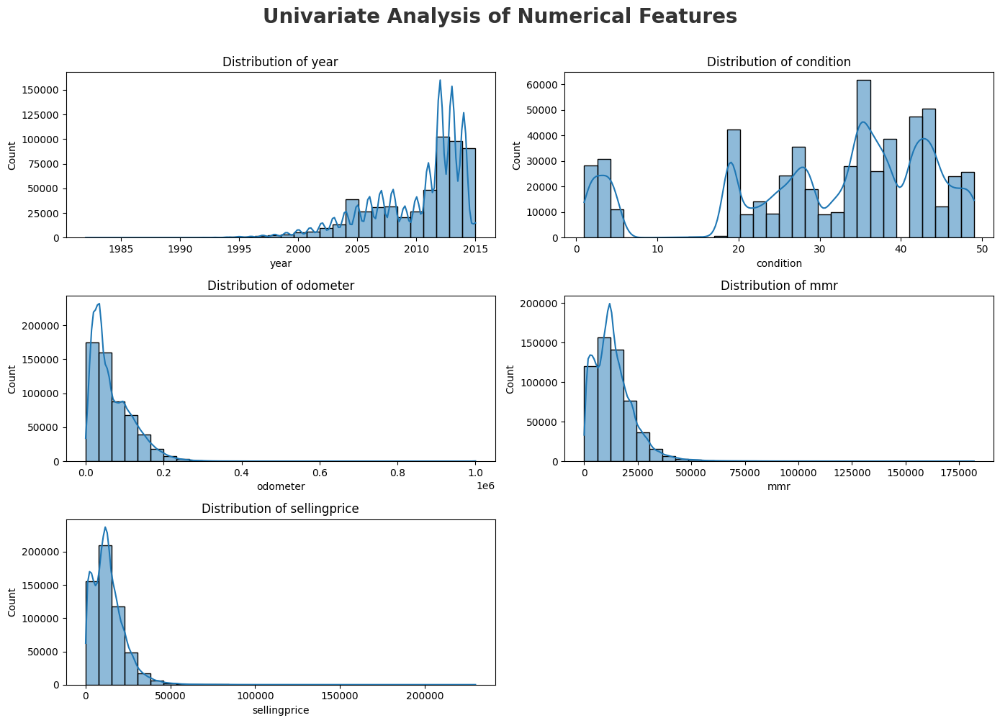

<Figure size 640x480 with 0 Axes>

In [19]:
# Exploratory Data Analysis (EDA)
# Univariate Analysis
#Histogram
num_columns=df.select_dtypes(include=np.number).columns.to_list()
plt.figure(figsize=(14,10))
plt.suptitle("Univariate Analysis of Numerical Features",fontsize=20,fontweight='bold',alpha=0.8,y=1.)
for i, col in enumerate (num_columns):
    plt.subplot(3,2,i+1)
    sns.histplot(df[col], bins=30, kde=True)
    plt.title(f"Distribution of {col}")
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()
plt.savefig("Univariate Analysis of Numerical Features.jpg")

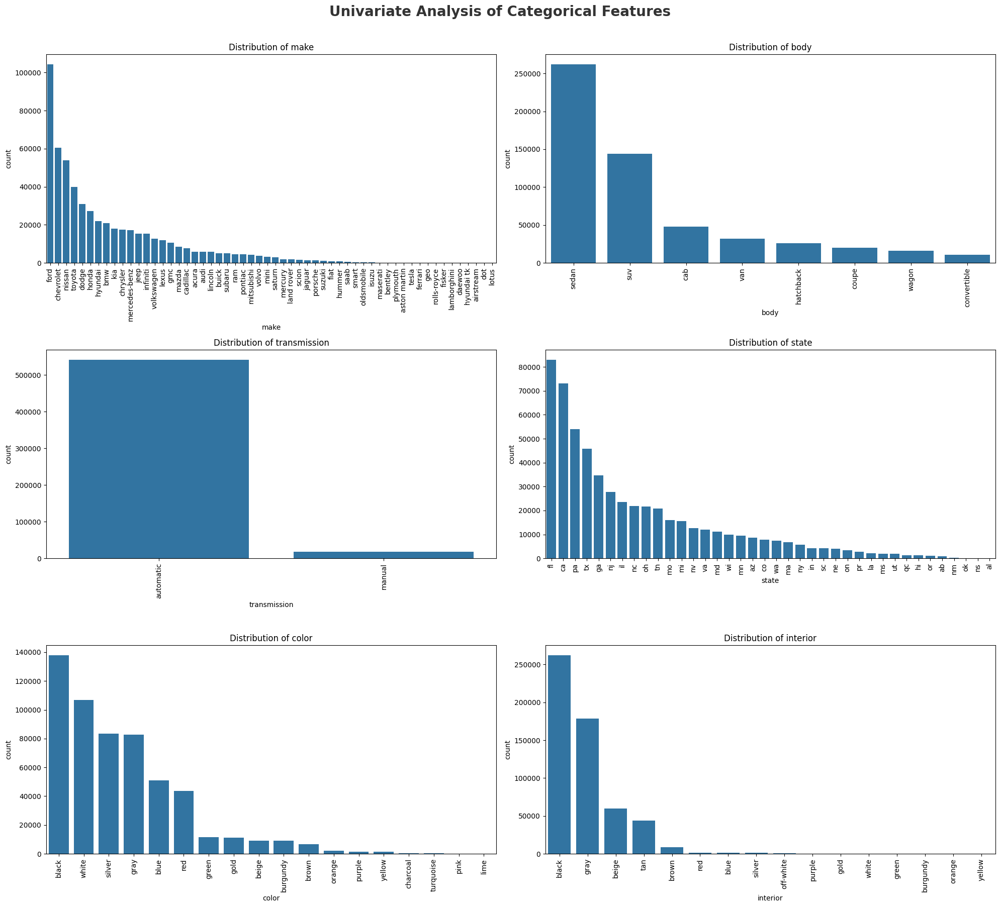

<Figure size 640x480 with 0 Axes>

In [20]:
#Countplot
cat_columns=['make','body', 'transmission','state', 'color', 'interior']
plt.figure(figsize=(20,18))
plt.suptitle("Univariate Analysis of Categorical Features",fontsize=20,fontweight='bold',alpha=0.8,y=1.)
for i, col in enumerate (cat_columns):
    plt.subplot(3,2,i+1)
    sns.countplot(x=df[col], order=df[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.title(f"Distribution of {col}")
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()
plt.savefig("Univariate Analysis of Categorical Features.jpg")

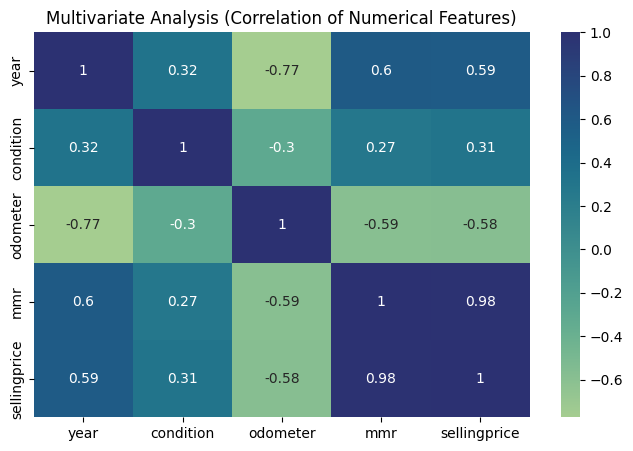

<Figure size 640x480 with 0 Axes>

In [21]:
# Multivariate Analysis
#Check Multicollinearity of Numerical Features
#Heatmap
plt.figure(figsize=(8,5))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="crest")
plt.title("Multivariate Analysis (Correlation of Numerical Features)")
plt.show()
plt.savefig("Multivariate Analysis (Correlation of Numerical Features).jpg")

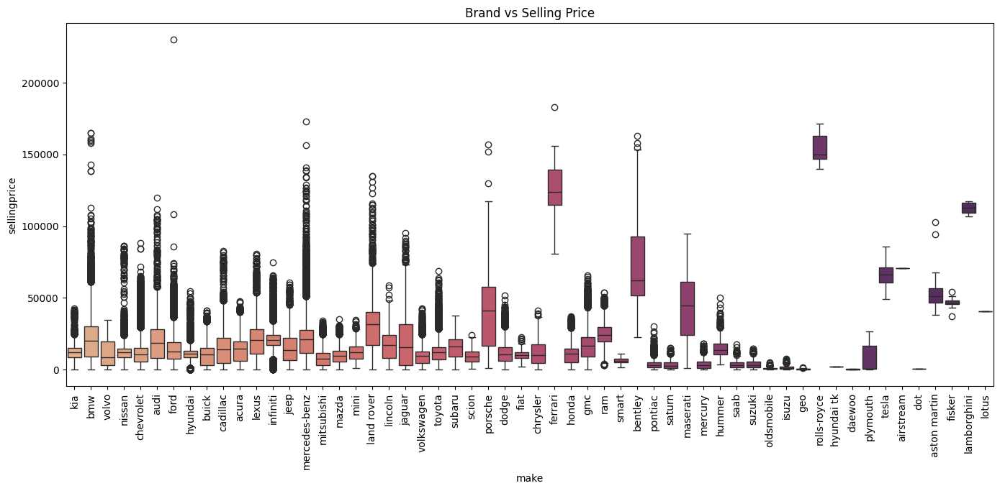

<Figure size 640x480 with 0 Axes>

In [22]:
#Brand vs Selling Price
if 'make' in df.columns:
    plt.figure(figsize=(14,7))
    sns.boxplot(x='make', y='sellingprice', data=df, palette='flare')
    plt.xticks(rotation=90)
    plt.title("Brand vs Selling Price")
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    plt.savefig("Brand vs Selling Price (boxplot).jpg")

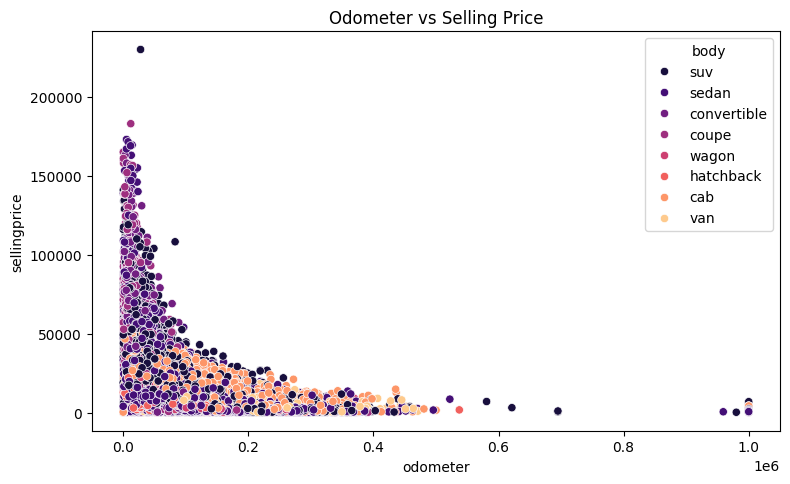

<Figure size 640x480 with 0 Axes>

In [23]:
#Odometer vs Selling Price
if 'odometer' in df.columns:
    plt.figure(figsize=(8,5))
    sns.scatterplot(x='odometer', y='sellingprice', data=df, hue='body', palette='magma')
    plt.title("Odometer vs Selling Price")
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    plt.savefig("Odometer vs Selling Price (scatterplot).jpg")

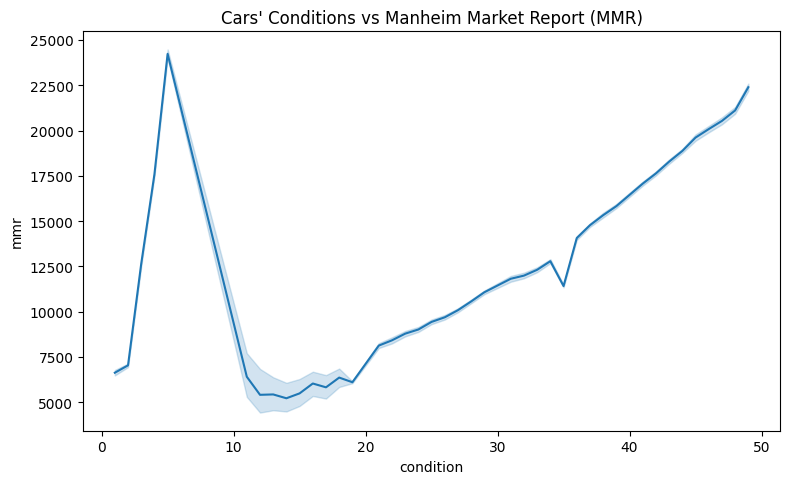

<Figure size 640x480 with 0 Axes>

In [24]:
# Data Visualization
#Condition vs MMR
if 'condition' in df.columns:
    plt.figure(figsize=(8,5))
    sns.lineplot(x='condition', y='mmr', data=df)
    plt.title("Cars' Conditions vs Manheim Market Report (MMR)")
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    plt.show()
    plt.savefig("Condition vs MMR.jpg")

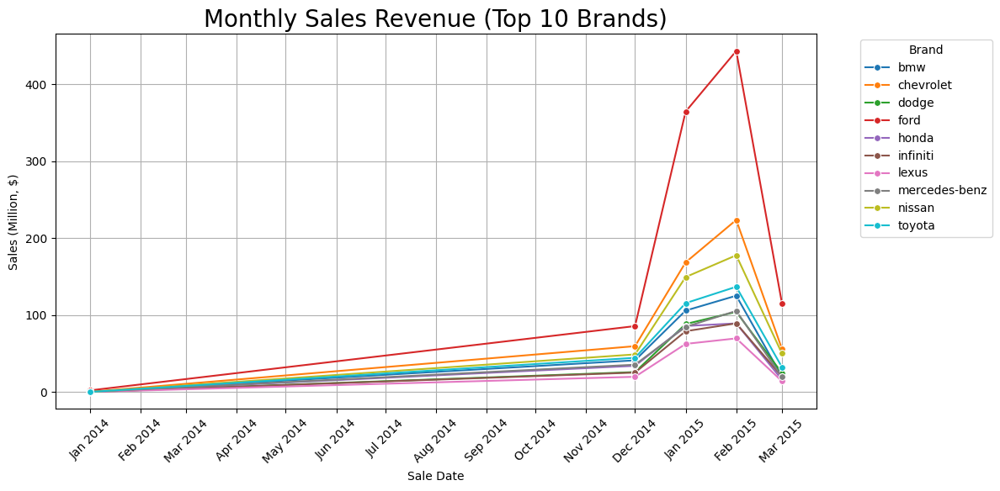

<Figure size 640x480 with 0 Axes>

In [25]:
#Trend

#Parsing datetime
df['date'] = pd.to_datetime(df['saledate'], errors="coerce").dt.tz_convert(None)

#Group by saledate (monthly) and brand, then sum selling price
group = df.groupby([
    df['date'].dt.to_period('M').dt.to_timestamp(),  # group by month
    'make'
])['sellingprice'].sum().reset_index()

# Top 10 brands by total selling price
top_brand = (
    group.groupby('make')['sellingprice']
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .index
)

# Filter grouped data to only include those brands
top_group = group[group['make'].isin(top_brand)]

# Convert sales to millions
top_group.loc[:, 'Sales (Million)'] = top_group['sellingprice'] / 1e6

# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=top_group, x='date', y='Sales (Million)', hue='make', marker=(8,0,0))
plt.title('Monthly Sales Revenue (Top 10 Brands)', fontsize=20)
plt.xlabel('Sale Date')
plt.ylabel('Sales (Million, $)')
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # every 1 month
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))  # format as Jan 2015
plt.xticks(rotation=45)
plt.legend(title='Brand', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.grid(True)
plt.show()
plt.savefig("Monthly Sales Revenue (Top 10 Brands).jpg")

In [26]:
#Costliest Brand and Costliest Car
top_model = (df['make'] + ' - ' + df['model']).value_counts().head(10).reset_index()
top_model.columns = ['BrandModel', 'Quantity']

max_val = top_model['Quantity'].max()

fig = px.bar(
    top_model,
    x='BrandModel',
    y='Quantity',
    title='Top 10 Most Popular Cars (Brand - Model)',
    text='Quantity'
)

fig.update_traces(textposition='outside')

fig.update_layout(
    yaxis=dict(range=[0, max_val * 1.2]),
    xaxis_tickangle=-45
)

fig.show()
fig.write_html("Top 10 Most Popular Cars.html")

In [27]:
# Combine brand and model
df['BrandModel'] = df['make'] + ' - ' + df['model']

# Group by BrandModel and sum the selling price
top_model_revenue = (
    df.groupby('BrandModel')['sellingprice']
    .sum()
    .sort_values(ascending=False)
    .head(10)
    .reset_index()
)
top_model_revenue['TotalRevenueMillions$'] = (top_model_revenue['sellingprice'] / 1e6).round(2)

# Get max revenue value to set y-axis limit
max_val = top_model_revenue['TotalRevenueMillions$'].max()

# Create the bar chart
fig = px.bar(
    top_model_revenue,
    x='BrandModel',
    y='TotalRevenueMillions$',
    title='Top 10 Cars by Total Sales Revenue (in Millions)',
    text='TotalRevenueMillions$'
)

fig.update_traces(textposition='outside')

fig.update_layout(
    yaxis=dict(range=[0, max_val * 1.2]),  # 20% headroom
    yaxis_title='Revenue (Millions $)',
    xaxis_tickangle=-45,
    xaxis=dict(categoryorder='total descending')
)

fig.show()
fig.write_html("Top 10 Cars by Total Sales Revenue.html")

In [28]:
#Treemap
model_revenue = (
    df.groupby(['make', 'model'])['sellingprice']
    .sum()
    .reset_index()
    .sort_values(by='sellingprice', ascending=False)
)

fig = px.treemap(
    model_revenue.head(50),  # Limit to top 50 for clarity
    path=['make', 'model'],
    values='sellingprice',
    title='Top Cars Models by Total Revenue'
)
fig.show()
fig.write_html("Top Cars Models by Total Revenue (treemap).html")

In [29]:
#scatter
fig = px.scatter(
    df,
    x='year',
    y='sellingprice',
    color='make',  
    title='Car Selling Price vs Manufacturing Year by Brand',
    opacity=0.6,
    height=600
)

fig.update_layout(
    xaxis=dict(dtick=1),
    yaxis_title='Selling Price ($)',
    xaxis_title='Year',
    legend_title='Brand',
    margin=dict(l=60, r=20, t=60, b=60)
)

fig.show()
fig.write_html("Cars Selling Price vs Manufacturing Year by Brand (scatter).html")

In [30]:
# Data Modeling
#target
y = df['sellingprice']

#predictor features
X = df[['year', 'condition', 'odometer', 'mmr']]

#split: train and test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

#Linear Regression
linreg = LinearRegression()
linreg.fit(X_train, y_train)

#prediction
y_pred = linreg.predict(X_test)

#evaluation
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("=== Linear Regression ===")
print("MAE:", mae)
print("RMSE:", rmse)
print("R² Score:", r2)

#coef feature
coef = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': linreg.coef_
}).sort_values(by='Coefficient', ascending=False)
print("\nCoefficient Linear Regression:")
print(coef)

=== Linear Regression ===
MAE: 1048.999728859426
RMSE: 1651.0124466013035
R² Score: 0.970908943522719

Coefficient Linear Regression:
     Feature  Coefficient
1  condition    36.746031
3        mmr     0.983765
2   odometer    -0.001087
0       year   -41.516541


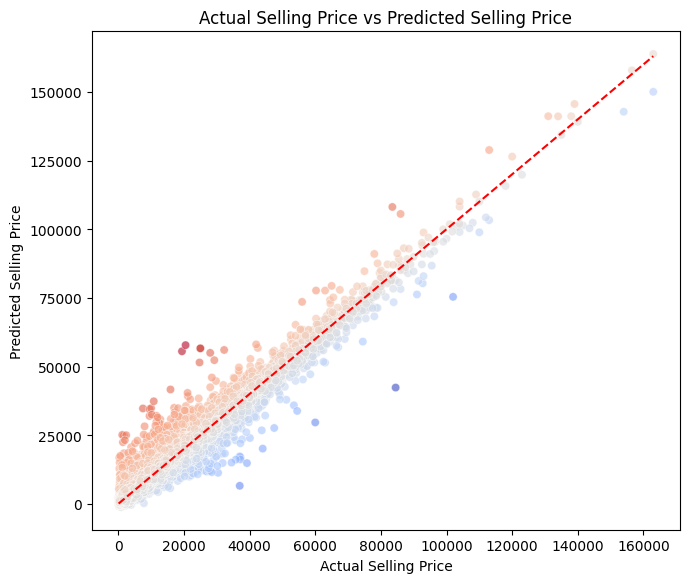

<Figure size 640x480 with 0 Axes>

In [31]:
#Scatterplot selling price vs prediction price
plt.figure(figsize=(7,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6, hue=(y_pred - y_test), palette="coolwarm", legend=False)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  #ideal line
plt.xlabel("Actual Selling Price")
plt.ylabel("Predicted Selling Price")
plt.title("Actual Selling Price vs Predicted Selling Price")
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()
plt.savefig("Actual Selling Price vs Predicted Selling Price.jpg")

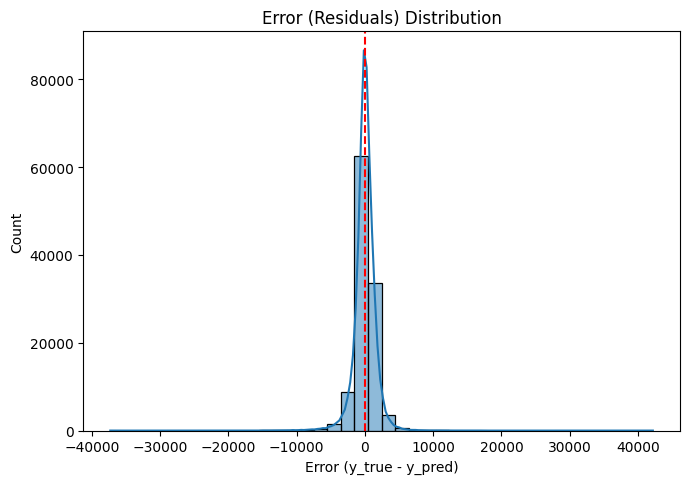

In [32]:
# Distribution Plot Error (Residuals)
errors = y_test - y_pred
plt.figure(figsize=(7,5))
sns.histplot(errors, bins=40, kde=True)
plt.axvline(0, color='red', linestyle='--')
plt.xlabel("Error (y_true - y_pred)")
plt.title("Error (Residuals) Distribution")
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

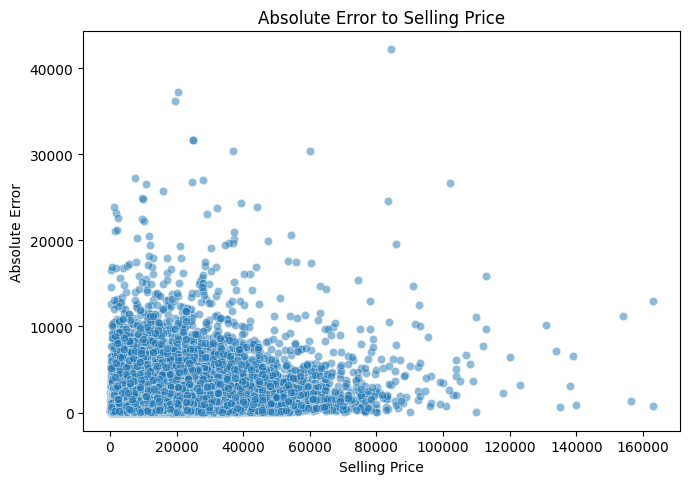

In [33]:
#Error Absolute vs Selling Price
abs_errors = abs(errors)
plt.figure(figsize=(7,5))
sns.scatterplot(x=y_test, y=abs_errors, alpha=0.5)
plt.xlabel("Selling Price")
plt.ylabel("Absolute Error")
plt.title("Absolute Error to Selling Price")
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()